# 📷 ***Computer Vision, HW1*** 📚

* **Member 1** : [Kasra Kashani, 810101490] 🆔
* **Member 2** : [Alborz Mahmoudian, 810101514] 🆔

## 🔹**Imports**

Import required modules.

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

## 📍 Section 1

In [133]:
filename = "Pic.jpg"

# Read image
img_bgr = cv2.imread(filename, cv2.IMREAD_COLOR)

# Check if image was loaded correctly
if img_bgr is None:
    raise ValueError("Image could not be read or unsupported format.")

# Get data type and number of channels
dtype = img_bgr.dtype
shape = img_bgr.shape
channels = 1 if len(shape) == 2 else shape[2]

print("File name:", filename)
print("Data type (dtype):", dtype)
print("Image shape (height, width, [channels]):", shape)
print("Number of color channels:", channels)

File name: Pic.jpg
Data type (dtype): uint8
Image shape (height, width, [channels]): (600, 800, 3)
Number of color channels: 3


<p dir='rtl' style='background:#fffbe6; font-family: Vazir; border:1px dashed #f0ad4e; padding:12px; border-radius:8px; color:#111'>
تبدیل تصویر به RGB، خاکستری و دودویی<br>
تصویر RGB:<br>
مدل RGB شامل سه کانال قرمز، سبز و آبی است؛ هر پیکسل یک سه‌تایی (R,G,B) دارد. برای تصویر با dtype = uint8 هر کانال مقداری در بازه ۰ تا ۲۵۵ می‌گیرد و ترکیب این سه مقدار رنگ نهایی هر پیکسل را می‌سازد.<br>
اگر مقدار R زیاد و G و B کم باشد، رنگ به سمت قرمز میل می‌کند. اگر مقدار G زیاد باشد رنگ مایل به سبز، و اگر مقدار B زیاد باشد رنگ مایل به آبی می‌شود.<br>
زمانی که هر سه کانال مقدار بالایی دارند (نزدیک ۲۵۵)، رنگ حاصل نزدیک به سفید است، و وقتی هر سه مقدار پایین هستند (نزدیک صفر)، رنگ به سمت سیاه می‌رود.<br>
تصویر خاکستری (Grayscale):<br>
در تصویر خاکستری هر پیکسل تنها یک مقدار شدت نور دارد (روشنایی). برای تصاویر uint8 این مقدار نیز در بازه ۰–۲۵۵ قرار می‌گیرد. معمولاً از ترکیب وزنی کانال‌های RGB (مثلاً 0.299R + 0.587G + 0.114B) برای تبدیل استفاده می‌شود.<br>
تصویر دودویی (Binary):<br>
تصویر دودویی تنها دو مقدار ممکن دارد؛ معمولاً برای ذخیره و نمایش از ۰ (سیاه) و ۲۵۵ (سفید) استفاده می‌شود. با آستانه‌گذاری روی تصویر خاکستری (مثلاً روش اتسو) پیکسل‌ها به دو دسته تقسیم می‌شوند و هر دسته به ۰ یا ۲۵۵ نگاشت می‌شود.<br>
</p>

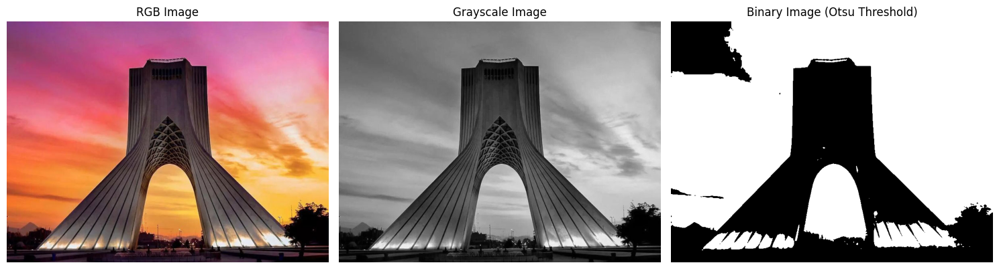

In [134]:
# Convert BGR → RGB for correct display in matplotlib
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

# Convert to Grayscale
img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

# Convert to Binary using Otsu's thresholding
img_blur = cv2.GaussianBlur(img_gray, (5, 5), 0)
_, img_binary = cv2.threshold(img_blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Display all three images
fig, axes = plt.subplots(1, 3, figsize=(15, 6))

axes[0].imshow(img_rgb)
axes[0].set_title("RGB Image")
axes[0].axis("off")

axes[1].imshow(img_gray, cmap='gray')
axes[1].set_title("Grayscale Image")
axes[1].axis("off")

axes[2].imshow(img_binary, cmap='gray')
axes[2].set_title("Binary Image (Otsu Threshold)")
axes[2].axis("off")

plt.tight_layout()
plt.show()

<p dir='rtl' style='background:#fffbe6; font-family: Vazir; border:1px dashed #f0ad4e; padding:12px; border-radius:8px; color:#111'>
مدل رنگی HSV یکی از مدل‌های رایج برای نمایش رنگ است که از سه مولفه تشکیل شده است.<br>
<br>
مولفه H (Hue)<br>
این مولفه رنگ اصلی را نشان می‌دهد و به صورت زاویه‌ای در دایره رنگ تعریف می‌شود.<br>
مقدار آن معمولاً بین ۰ تا ۳۶۰ درجه است و رنگ‌هایی مانند قرمز، سبز و آبی را مشخص می‌کند.<br>
<br>
مولفه S (Saturation)<br>
این مولفه میزان خلوص یا شدت رنگ را بیان می‌کند.<br>
مقدار صفر به معنی رنگ خاکستری (بدون رنگ) و مقدار زیاد به معنی رنگ زنده و خالص است.<br>
در OpenCV این مقدار بین ۰ تا ۲۵۵ است.<br>
<br>
مولفه V (Value)<br>
این مولفه میزان روشنایی رنگ را مشخص می‌کند.<br>
مقدار صفر به معنی سیاهی کامل و مقدار زیاد به معنی روشنایی بالا است.<br>
در OpenCV مقدار آن نیز بین ۰ تا ۲۵۵ قرار دارد.<br>
<br>
در این مدل، جدا کردن شدت رنگ از روشنایی باعث می‌شود که برای پردازش‌های تصویری مانند تشخیص رنگ یا فیلترگذاری، کنترل بیشتری روی هر جنبه از رنگ داشته باشیم.<br>

</p>

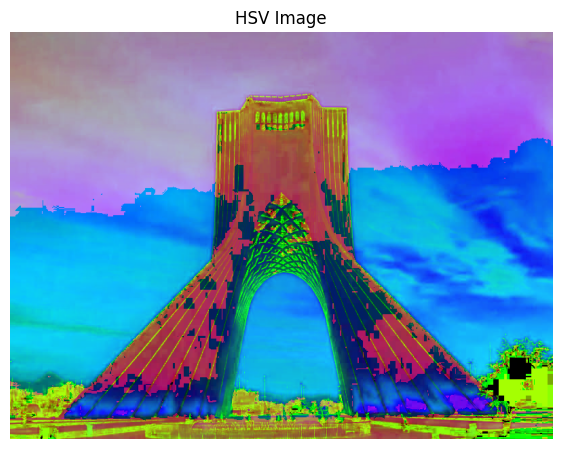

In [135]:
# Convert from BGR (OpenCV default) to HSV
img_hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)

# Display the image
plt.figure(figsize=(7, 7))
plt.imshow(img_hsv)
plt.title("HSV Image")
plt.axis("off")
plt.show()

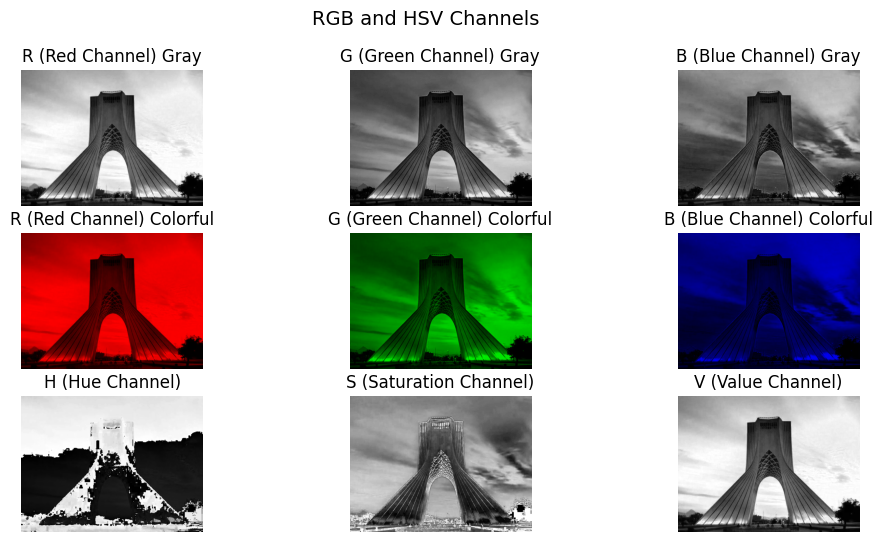

In [137]:
# Convert BGR to RGB (for correct color order)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

# Split RGB channels
r, g, b = cv2.split(img_rgb)

r_colorful = np.dstack([r, np.zeros_like(r), np.zeros_like(r)])
g_colorful = np.dstack([np.zeros_like(g), g, np.zeros_like(g)])
b_colorful = np.dstack([np.zeros_like(b), np.zeros_like(b), b])

# Convert BGR to HSV and split channels
img_hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)
h, s, v = cv2.split(img_hsv)

# Show RGB channels
plt.figure(figsize=(12, 6))
plt.subplot(3, 3, 1)
plt.imshow(r, cmap='gray')
plt.title("R (Red Channel) Gray")
plt.axis("off")

plt.subplot(3, 3, 2)
plt.imshow(g, cmap='gray')
plt.title("G (Green Channel) Gray")
plt.axis("off")

plt.subplot(3, 3, 3)
plt.imshow(b, cmap='gray')
plt.title("B (Blue Channel) Gray")
plt.axis("off")

plt.subplot(3, 3, 4)
plt.imshow(r_colorful)
plt.title("R (Red Channel) Colorful")
plt.axis("off")

plt.subplot(3, 3, 5)
plt.imshow(g_colorful)
plt.title("G (Green Channel) Colorful")
plt.axis("off")

plt.subplot(3, 3, 6)
plt.imshow(b_colorful)
plt.title("B (Blue Channel) Colorful")
plt.axis("off")

# Show HSV channels
plt.subplot(3, 3, 7)
plt.imshow(h, cmap='gray')
plt.title("H (Hue Channel)")
plt.axis("off")

plt.subplot(3, 3, 8)
plt.imshow(s, cmap='gray')
plt.title("S (Saturation Channel)")
plt.axis("off")

plt.subplot(3, 3, 9)
plt.imshow(v, cmap='gray')
plt.title("V (Value Channel)")
plt.axis("off")

plt.suptitle("RGB and HSV Channels", fontsize=14)
plt.show()


<p dir='rtl' style='background:#fffbe6; font-family: Vazir; border:1px dashed #f0ad4e; padding:12px; border-radius:8px; color:#111'>
کنتراست (Contrast) یکی از ویژگی‌های مهم تصویر است که میزان تفاوت بین روشن‌ترین و تاریک‌ترین بخش‌های تصویر را نشان می‌دهد.<br>
<br>
تعریف ریاضی:<br>
کنتراست را می‌توان به صورت انحراف معیار شدت پیکسل‌ها تعریف کرد:<br>
<br>
σ = √(1/N ∑(Iᵢ - μ)²)<br>
<br>
در اینجا Iᵢ مقدار شدت پیکسل ، μ میانگین شدت پیکسل‌ها و N تعداد کل پیکسل‌ها است.<br>
هرچه انحراف معیار بزرگتر باشد، تصویر دارای کنتراست بالاتری است.<br>
<br>
تغییر کنتراست<br>
برای افزایش یا کاهش کنتراست، می‌توان از فرمول خطی زیر استفاده کرد:<br>
I_new = α × I_original + β<br>
- α بزرگتر از ۱ : افزایش کنتراست<br>
- α بین صفر و یک : کاهش کنتراست<br>
- β : تغییر روشنایی (معمولاً صفر در نظر گرفته می‌شود)<br>
<br>
پیاده‌سازی :<br>
۱. تصویر را به خاکستری تبدیل می‌کنیم تا محاسبه کنتراست ساده‌تر شود.<br>
۲. انحراف معیار تصویر محاسبه می‌شود تا مقدار کنتراست اولیه بدست آید.<br>
۳ . با استفاده از ضریب α، یک نسخه با کنتراست بالاتر و یک نسخه با کنتراست پایین‌تر تولید می‌شود.<br>
</p>

Original Contrast: 58.57388482607882
Increased Contrast: 78.75530837151351
Decreased Contrast: 5.87426083009451


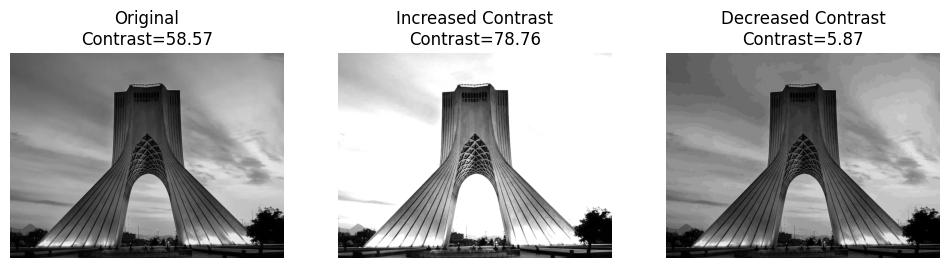

In [ ]:
# Load the image
filename = "Pic.jpg"
img = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)  # convert to grayscale for easier computation

# Calculate contrast (standard deviation of pixel intensities)
contrast_original = np.std(img)
print("Original Contrast:", contrast_original)

# Increase contrast
alpha_high = 2  
img_high_contrast = cv2.convertScaleAbs(img, alpha=alpha_high, beta=0)
contrast_high = np.std(img_high_contrast)
print("Increased Contrast:", contrast_high)

# Decrease contrast
alpha_low = 0.1 
img_low_contrast = cv2.convertScaleAbs(img, alpha=alpha_low, beta=0)
contrast_low = np.std(img_low_contrast)
print("Decreased Contrast:", contrast_low)

# Display the images with contrast values in the title
plt.figure(figsize=(12,4))

plt.subplot(1,3,1)
plt.imshow(img, cmap='gray')
plt.title(f"Original Gray\nContrast={contrast_original:.2f}")
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(img_high_contrast, cmap='gray')
plt.title(f"Increased Contrast Gray\nContrast={contrast_high:.2f}")
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(img_low_contrast, cmap='gray')
plt.title(f"Decreased Contrast Gray\nContrast={contrast_low:.2f}")
plt.axis('off')

plt.show()

<p dir='rtl' style='background:#fffbe6; font-family: Vazir; border:1px dashed #f0ad4e; padding:12px; border-radius:8px; color:#111'> 
- وقتی α = 0.1 است، بیشتر مقادیر پیکسل کوچک می‌شوند و تنها تعداد کمی به صفر می‌رسند. بنابراین کنتراست دقیقا ۱/۱۰ می‌شود.<br>
- وقتی α = 2 است، بسیاری از مقادیر پیکسل از ۲۵۵ بزرگتر می‌شوند و به ۲۵۵ محدود می‌شوند. این محدودیت باعث می‌شود افزایش کنتراست کمتر از دو برابر شود و std deviation به صورت خطی افزایش نیابد.<br> <br>
- کاهش کنتراست با α < 1 خطی است.<br> 
- افزایش کنتراست با α > 1 محدود به دلیل clipping است.<br>

<p dir='rtl' style='background:#fffbe6; font-family: Vazir; border:1px dashed #f0ad4e; padding:12px; border-radius:8px; color:#111'> 
هیستوگرام تصویر یک نمودار است که توزیع شدت پیکسل‌ها را نشان می‌دهد.<br>
به عبارت دیگر، هیستوگرام تعداد پیکسل‌ها را برای هر مقدار روشنایی (Intensity) نمایش می‌دهد.<br>
<br>
هیستوگرام تصویر خاکستری:<br>
برای تصاویر خاکستری، محور افقی مقدار شدت پیکسل (۰ تا ۲۵۵) و محور عمودی تعداد پیکسل‌ها با آن شدت را نشان می‌دهد.<br> هیستوگرام کمک می‌کند تا خصوصیات روشنایی و کنتراست تصویر را بهتر درک کنیم و برای پردازش تصویر مانند تنظیم روشنایی، بهبود کنتراست و آستانه‌گذاری استفاده می‌شود.<br>
هیستوگرام تصویر رنگی:<br>
هر کانال یک ماتریس ۲ بعدی از مقادیر پیکسل‌ها دارد که شدت آن رنگ را در هر پیکسل مشخص می‌کند.<br>
مقادیر هر کانال بین ۰ تا ۲۵۵ هستند و ترکیب این سه مقدار رنگ نهایی هر پیکسل را می‌سازد.<br>
برای تصویر رنگی، می‌توان هیستوگرام جداگانه برای هر کانال رسم کرد تا توزیع شدت رنگ‌ها در تصویر مشخص شود.<br>
- کانال B: نمودار توزیع مقادیر آبی<br>
- کانال G: نمودار توزیع مقادیر سبز<br>
- کانال R: نمودار توزیع مقادیر قرمز<br>
<br>
این روش به تحلیل رنگ‌ها، تنظیم رنگ و بهبود کنتراست در تصاویر رنگی کمک می‌کند و تصویر را به صورت کامل‌تر بررسی می‌نماید.<br>
</p>

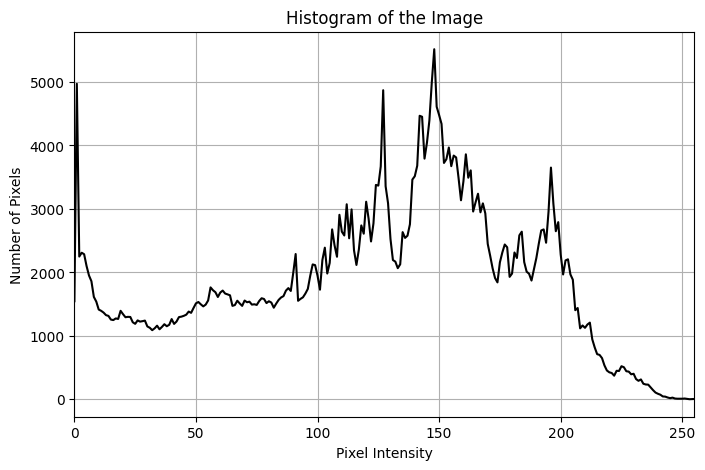

In [ ]:
# Load image in grayscale
filename = "Pic.jpg"
img = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)

# Calculate histogram using OpenCV
hist = cv2.calcHist([img], [0], None, [256], [0,256])

# Plot histogram
plt.figure(figsize=(8,5))
plt.plot(hist, color='black')
plt.title("Histogram of the Image")
plt.xlabel("Pixel Intensity")
plt.ylabel("Number of Pixels")
plt.xlim([0,255])
plt.grid(True)
plt.show()

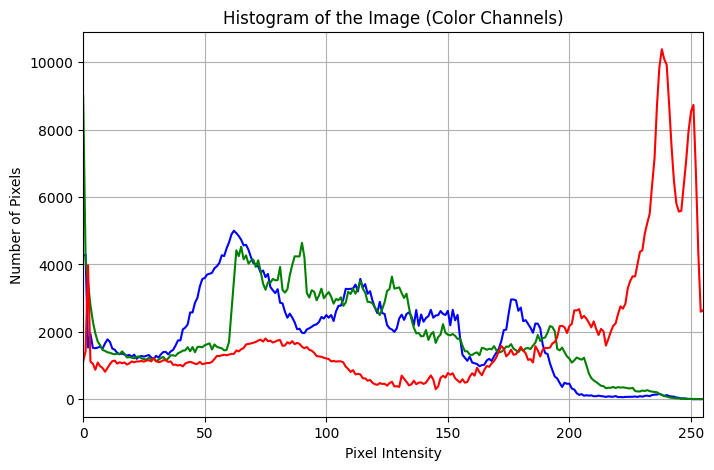

In [ ]:
img = cv2.imread("Pic.jpg", cv2.IMREAD_COLOR)
colors = ('b','g','r')
plt.figure(figsize=(8,5))
for i, color in enumerate(colors):
    hist = cv2.calcHist([img], [i], None, [256], [0,256])
    plt.plot(hist, color=color)
plt.title("Histogram of the Image (Color Channels)")
plt.xlabel("Pixel Intensity")
plt.ylabel("Number of Pixels")
plt.xlim([0,255])
plt.grid(True)
plt.show()

<p dir='rtl' style='background:#fffbe6; font-family: Vazir; border:1px dashed #f0ad4e; padding:12px; border-radius:8px; color:#111'> هیستوگرام تصویر نمایانگر توزیع شدت پیکسل‌هاست و با استفاده از روش‌های مختلف می‌توان روشنایی و کنتراست تصویر را بهبود داد. دو روش رایج عبارتند از:
Equalization Histogram (تساوی هیستوگرام):<br>
این روش هدفش یکنواخت کردن توزیع هیستوگرام تصویر است. به عبارت دیگر، سعی می‌شود تعداد پیکسل‌ها در تمام سطوح روشنایی تقریباً یکسان شود.
با اعمال این روش، مناطق تاریک تصویر روشن‌تر و مناطق روشن به شکل بهتری دیده می‌شوند.
این روش به ویژه برای تصاویر تاریک، کم‌کنتراست یا تصاویر با نورپردازی نامناسب بسیار مؤثر است.
نکته مهم: Equalization شدت‌های پیکسل را به صورت غیرخطی تغییر می‌دهد تا هیستوگرام تصویر تقریباً مسطح شود، بنابراین تصویر ممکن است جزئیات در برخی نواحی روشنایی بهبود یا کمی تغییر کند.<br>
Stretching Histogram (کشیدن هیستوگرام):<br>
این روش محدوده شدت پیکسل‌ها را خطی از حداقل تا حداکثر مقدار گسترش می‌دهد تا از کل بازه ۰ تا ۲۵۵ استفاده شود.
در واقع، پیکسل‌های تاریک به سمت ۰ و پیکسل‌های روشن به سمت ۲۵۵ منتقل می‌شوند و اختلاف بین روشن‌ترین و تاریک‌ترین نقاط تصویر افزایش می‌یابد.
مزیت این روش این است که ساختار نسبی تصویر حفظ می‌شود و تنها کنتراست کلی تصویر افزایش می‌یابد، بدون اینکه توزیع پیکسل‌ها به صورت غیرخطی تغییر کند.
این روش برای بهبود دیداری تصاویر با کنتراست کم یا تصاویر با محدوده دینامیکی محدود مناسب است.<br>
در کل:<br>
Equalization برای یکنواخت کردن هیستوگرام و افزایش جزئیات در مناطق تاریک/روشن مفید است.<br>
Stretching برای افزایش کلی کنتراست بدون تغییر توزیع نسبی شدت‌ها استفاده می‌شود.<br>
هر دو روش از ابزارهای مهم پردازش تصویر برای بهبود کیفیت تصاویر هستند و بسته به نیاز می‌توان یکی یا هر دو را روی تصویر اعمال کرد.<br>
</p>

0 255


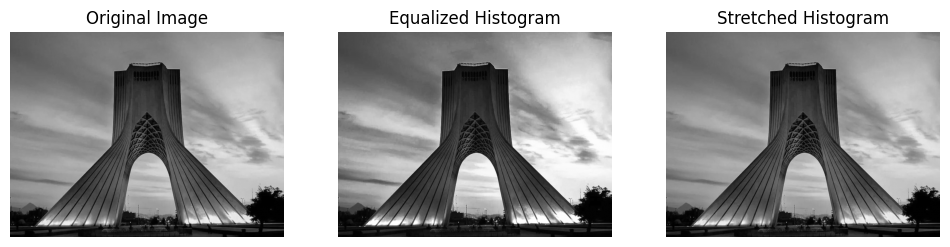

In [ ]:
# Load image in grayscale
filename = "Pic.jpg"
img = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)

# Histogram Equalization
img_equalized = cv2.equalizeHist(img)

# Histogram Stretching
# Compute min and max pixel values
min_val = np.min(img)
max_val = np.max(img)
print(min_val, max_val)
# Apply linear stretching
img_stretched = ((img - min_val) * (255 / (max_val - min_val))).astype(np.uint8)

# Display results
plt.figure(figsize=(12,4))

plt.subplot(1,3,1)
plt.imshow(img, cmap='gray')
plt.title("Original Image")
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(img_equalized, cmap='gray')
plt.title("Equalized Histogram")
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(img_stretched, cmap='gray')
plt.title("Stretched Histogram")
plt.axis('off')

plt.show()

<p dir='rtl' style='background:#fffbe6; font-family: Vazir; border:1px dashed #f0ad4e; padding:12px; border-radius:8px; color:#111'> 
اگر در تصویر خاکستری در ابتدا مقدار کمینه (min) برابر ۰ و مقدار بیشینه (max) برابر ۲۵۵ باشد، تصویر از قبل کل بازه شدت پیکسل‌ها را پوشش می‌دهد.<br>
در این حالت، اعمال روش **Histogram Stretching** تغییری در تصویر ایجاد نمی‌کند، زیرا فرمول کشش هیستوگرام به شکل زیر است:<br> <br>
I_stretched = ((I - min) / (max - min)) × 255<br> <br>
- وقتی min = 0 و max = 255 باشد، فرمول به شکل I_stretched = I در می‌آید.<br>
- در نتیجه، تصویر جدید با تصویر اصلی یکسان است و تغییر قابل مشاهده‌ای ندارد.<br> <br>
برای اینکه Stretching اثر قابل توجهی داشته باشد، تصویر باید محدوده شدت پیکسل‌هایش **کوچکتر از ۰–۲۵۵** باشد، یعنی مقادیر پیکسل‌ها تنها در یک بازه محدود قرار گرفته باشند.<br>
در چنین شرایطی، کشش هیستوگرام باعث گسترش شدت‌ها به کل بازه ۰–۲۵۵ شده و کنتراست تصویر به صورت قابل مشاهده افزایش می‌یابد.<br>
</p>

## 📍 Section 2

### 1. Loading the *Pic.jpg* image again.

We load our main image again, in its original (BGR) mode.

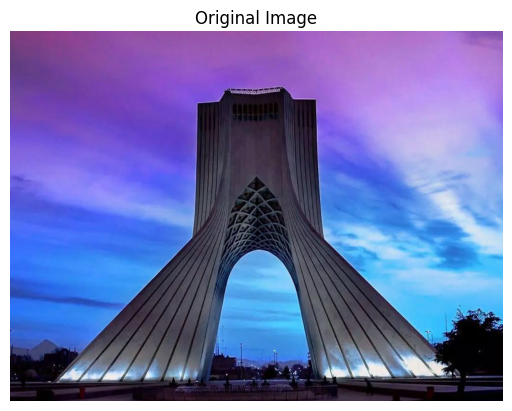

In [20]:
img_path = "Pic.jpg"

img = cv2.imread(img_path, cv2.IMREAD_COLOR)

plt.imshow(img)
plt.title("Original Image")
plt.axis("off")
plt.show()

### 2. Adding *Salt and Pepper Noise* to the original image.

***Salt and pepper noise*** is an impulse noise that randomly turns *some* image pixels to pepper (black or 0) or salt (white or 255). It often appears due to transmission errors or faulty sensor pixels. This noise strongly reduces image quality and is typically removed using a median filter or morphological operations.

In [138]:
def add_salt_pepper_noise(img, amount=0.02, salt_vs_pepper=0.5, seed=None):
    """
    img: input image 
    amount: proportion of pixels that get noised (from 0 to 1)
    salt_vs_pepper: proportion of salt (255) to paper (0) in those changable pixels (from 0 to 1)
    seed: randomness
    """

    if (seed is None):
        seed = np.random.default_rng()

    noisy = img.copy()

    h, w = noisy.shape[ : 2]
    num_pixels = h * w
    
    num_salt = int(np.ceil(amount * num_pixels * salt_vs_pepper))
    num_pepper = int(np.ceil(amount * num_pixels * (1.0 - salt_vs_pepper)))

    
    coords_salt = (seed.integers(0, h, num_salt), seed.integers(0, w, num_salt))
    coords_pepper = (seed.integers(0, h, num_pepper), seed.integers(0, w, num_pepper))

    if (noisy.ndim == 2):
        noisy[coords_salt] = 255
        noisy[coords_pepper] = 0
    else:
        noisy[coords_salt[0], coords_salt[1], : ] = 255
        noisy[coords_pepper[0], coords_pepper[1], : ] = 0

    return noisy

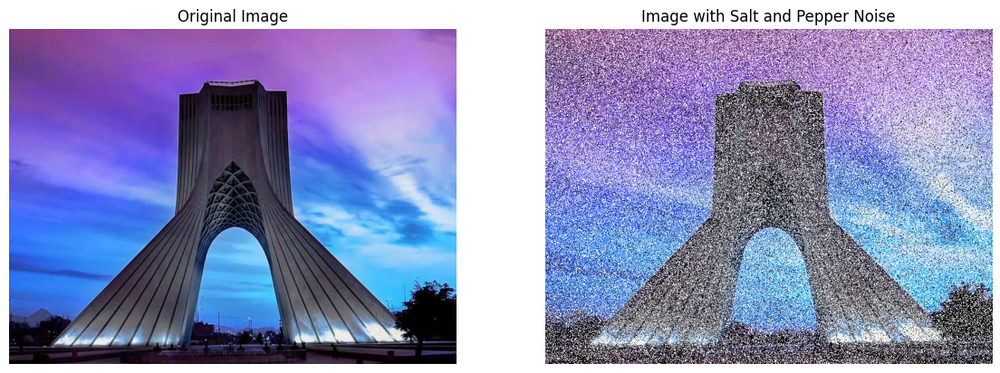

In [89]:
img_salt_pepper_noise = add_salt_pepper_noise(img, amount=0.5, salt_vs_pepper=0.8, seed=np.random.default_rng(42))

plt.figure(figsize=(14,8))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img_salt_pepper_noise)
plt.title("Image with Salt and Pepper Noise")
plt.axis("off")
plt.show()

***Gaussian noise*** is another common noise which is an additive continuous noise that adds random values from a normal distribution (mean = 0, variance = σ²) to *each* image pixel. It models natural sensor and electronic noise, such as thermal fluctuations in camera sensors. This noise gives images a grainy appearance and is commonly reduced using Gaussian filters, non-local means, or deep neural network denoising methods.

### 3. Explaining kernels in image processing and its applications and also the methods for applying them on images.

***Definition of kernel:***

In image processing, a kernel (filter or mask) is a small matrix of numbers that slides over an image to modify it in some way. Each number inside the kernel represents a weight that determines how much neighboring pixels affect the output pixel. A kernel is usually a square matrix like 3×3, 5×5, or 7×7, and so on. Also it is used in convolution, a mathematical operation that combines the kernel with the image. By changing the kernel’s numbers, we can perform many different effects, from removing noise to detecting features.

***How it works:***

1. Place the kernel with size $k$ over a small patch ($k \times k$) of the image.

2. Multiply each kernel value by the corresponding pixel value under it.

3. Sum up all these products.

4. Replace the central pixel with this new value.

5. Move the kernel to the next pixel and repeat for the whole image.

This process is called convolution, and it allows local features (like edges, corners, or texture) to be detected or enhanced.

***Common applications:***

- Blurring (Smoothing): Reduces noise or softens details. For example, averaging each pixel with its neighbors:
$$
\frac{1}{9}
\begin{bmatrix}
1 & 1 & 1 \\
1 & 1 & 1 \\
1 & 1 & 1
\end{bmatrix}
$$

- Edge Detection: Highlights places where intensity changes sharply. For example, detecting horizontal edges:
$$
\begin{bmatrix}
-1 & 0 & 1 \\
-2 & 0 & 2 \\
-1 & 0 & 1
\end{bmatrix}
$$

- Sharpening: Makes edges and details more pronounced. For example:
$$
\begin{bmatrix}
0 & -1 & 0 \\
-1 & 5 & -1 \\
0 & -1 & 0
\end{bmatrix}
$$

### 4. Applying *Mean Filter*, *Gaussian Filter*, and *Median Filter* on the original image.

- ***Mean Filter:*** It is a linear, low-pass smoothing filter. It replaces each pixel with the average of its neighbors. Its kernel type is *Uniform weights*; all entries equal and sum to 1. It is usefull for bluring high-frequency noise but also bluring edges (edge-detail is not preserved). It is also fast and can be implemented efficiently with integral images or separable 1D box filters. Some typical kernels (normalized so entries sum to 1):

    - $3 \times 3$ kernel:
    $$
    \frac{1}{9}
    \begin{bmatrix}
    1 & 1 & 1 \\
    1 & 1 & 1 \\
    1 & 1 & 1
    \end{bmatrix}
    $$

    - $5 \times 5$ kernel:
    $$
    \frac{1}{25}
    \begin{bmatrix}
    1 & 1 & 1 & 1 & 1 \\
    1 & 1 & 1 & 1 & 1 \\
    1 & 1 & 1 & 1 & 1 \\
    1 & 1 & 1 & 1 & 1 \\
    1 & 1 & 1 & 1 & 1
    \end{bmatrix}
    $$

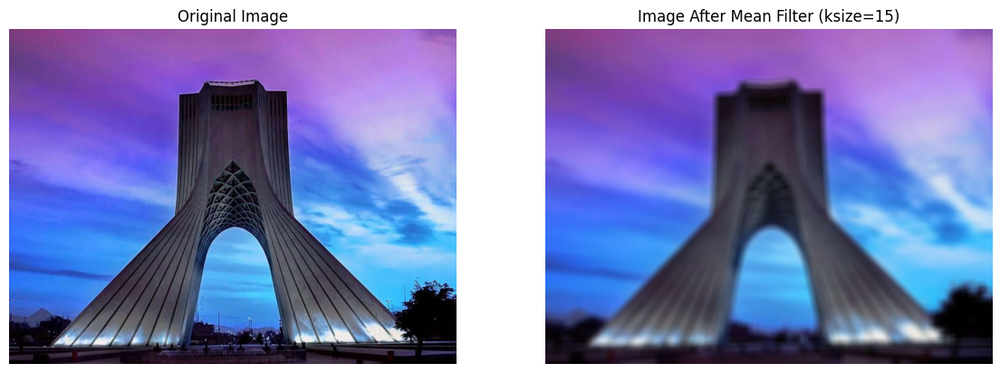

In [96]:
img_mean_filter = cv2.blur(img, (15, 15))

plt.figure(figsize=(14,8))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img_mean_filter)
plt.title("Image After Mean Filter (ksize=15)")
plt.axis("off")
plt.show()

- ***Gaussian Filter:*** It is a linear, low-pass filter with weights following a Gaussian (normal) distribution. It gives more weight to pixels near the center. Its kernel type is *Gaussian weights*; positive, symmetric, sum to 1, controlled by standard deviation σ. It is usefull in smoothing noise while preserving edges better than a mean filter (still blurs, but less edge smearing). Parameter σ controls the amount of blur; kernel size is typically chosen as $ksize ≈ 6σ + 1$. It is also separable; a 2D Gaussian equals a 1D horizontal * 1D vertical, so it’s efficient. Some typical kernels (normalized):

    - $3 \times 3$ kernel ($σ ≈ 0.85$):
    $$
    \frac{1}{16}
    \begin{bmatrix}
    1 & 2 & 1 \\
    2 & 4 & 2 \\
    1 & 2 & 1
    \end{bmatrix}
    $$

    - $5 \times 5$ kernel ($σ ≈ 1$):
    $$
    \frac{1}{273}
    \begin{bmatrix}
    1 & 4 & 7 & 4 & 1 \\
    4 & 16 & 26 & 16 & 4 \\
    7 & 26 & 41 & 26 & 7 \\
    4 & 16 & 26 & 6 & 4 \\
    1 & 4 & 7 & 4 & 1
    \end{bmatrix}
    $$

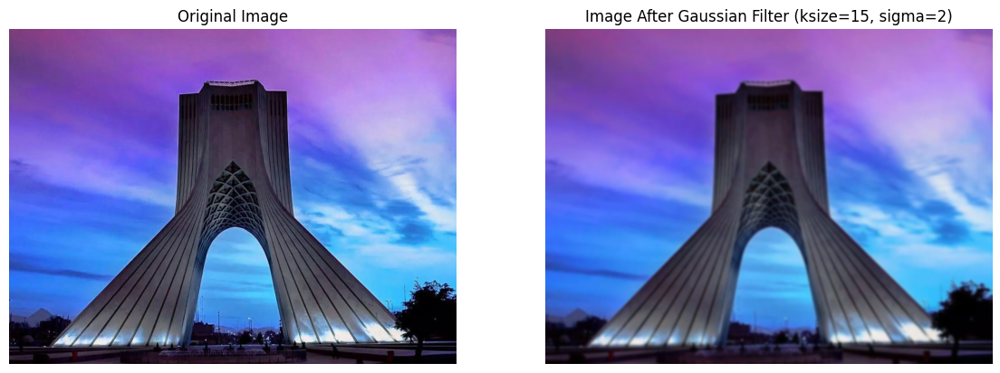

In [97]:
img_gaussian_filter = cv2.GaussianBlur(img, (15, 15), sigmaX=2)

plt.figure(figsize=(14,8))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img_gaussian_filter)
plt.title("Image After Gaussian Filter (ksize=15, sigma=2)")
plt.axis("off")
plt.show()

- ***Median Filter:*** It is a nonlinear, rank-order filter. Instead of averaging, it replaces each pixel with the median of the neighborhood values. Its kernel type is *No numeric weight matrix*; the kernel is the neighborhood shape or size (e.g., 3×3 window), and the operation is taking the median. It is exceptional at removing impulse noise (salt and pepper) while preserving edges (doesn’t average in the outliers). Also it is less suitable for purely Gaussian noise than Gaussian filtering, but often keeps edges crisper. As it is nonlinear, it cannot be expressed as a standard convolution. Some typical kernels:

    - $3 \times 3$ kernel: It takes the median of 9 pixels.

    - $5 \times 5$ kernel: It takes the median of 25 pixels.

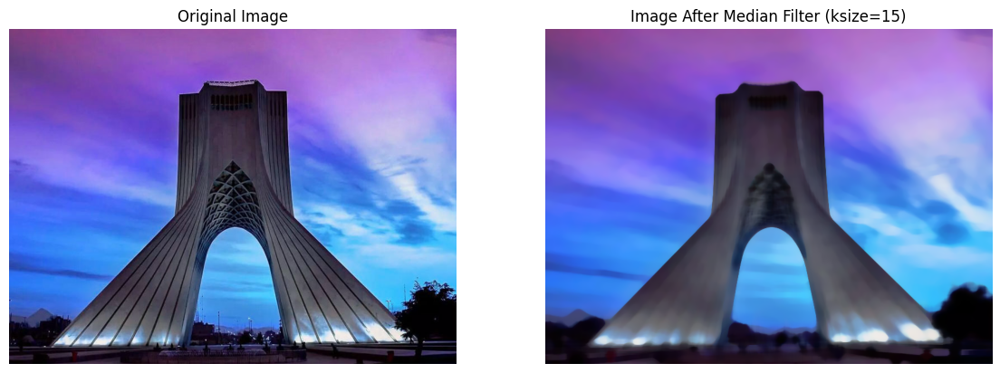

In [98]:
img_median_filter = cv2.medianBlur(img, 15)

plt.figure(figsize=(14,8))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img_median_filter)
plt.title("Image After Median Filter (ksize=15)")
plt.axis("off")
plt.show()

Also, we implement each filter without any built-in function.

In [ ]:
def reflect_padding(img, ksize):
    pad = ksize // 2

    if (img.ndim == 2):
        return np.pad(img, ((pad, pad), (pad, pad)), mode='reflect')
    else:
        return np.pad(img, ((pad, pad), (pad, pad), (0, 0)), mode='reflect')

def conv2d(img, kernel):
    kernel = kernel.astype(np.float32)

    ksize = kernel.shape[0]

    h, w = img.shape

    src = reflect_padding(img, ksize)

    out = np.zeros_like(img, dtype=np.float32)
    for i in range(h):
        for j in range(w):
            window = src[i : i + ksize, j : j + ksize]
            out[i, j] = np.sum(window * kernel)

    return out

def med2d(img, ksize):
    h, w = img.shape

    src = reflect_padding(img, ksize)

    out = np.empty_like(img)
    for i in range(h):
        for j in range(w):
            window = src[i : i + ksize, j : j + ksize]
            out[i, j] = np.median(window)

    return out

In [69]:
def mean_kernel(ksize):
    assert ksize % 2 == 1, "Kernel size must be and add number."

    kernel = np.ones((ksize, ksize), dtype=np.float32)
    kernel /= np.sum(kernel)

    return kernel

def mean_filter(img, ksize=3):
    img32 = img.astype(np.float32)

    kernel = mean_kernel(ksize)

    if (img32.ndim == 2):
        out = conv2d(img32, kernel)
    else:
        # Apply filter per channel
        out = np.empty_like(img32)
        for c in range(img32.shape[2]):
            out[..., c] = conv2d(img32[..., c], kernel)
            
    return np.clip(out, 0, 255).astype(np.uint8)

In [70]:
def gaussian_kernel(ksize, sigma):
    assert ksize % 2 == 1, "Kernel size must be an add number."

    ax = np.arange(-(ksize // 2), (ksize // 2) + 1)
    xx, yy = np.meshgrid(ax, ax)

    kernel= np.exp(-(xx**2 + yy**2) / (2.0 * sigma**2))
    kernel /= np.sum(kernel)

    return kernel.astype(np.float32)

def gaussian_filter(img, ksize=3, sigma=1.0):
    img32 = img.astype(np.float32)

    kernel = gaussian_kernel(ksize, sigma)

    if (img32.ndim == 2):
        out = conv2d(img32, kernel)
    else:
        # Apply filter per channel
        out = np.empty_like(img32)
        for c in range(img32.shape[2]):
            out[..., c] = conv2d(img32[..., c], kernel)

    return np.clip(out, 0, 255).astype(np.uint8)

In [71]:
def median_filter(img, ksize=3):
    assert ksize % 2 == 1, "Kernel size must be an add number."

    img32 = img.astype(np.float32)

    if (img32.ndim == 2):
        out = med2d(img32, ksize)
    else:
        # Apply filter per channel
        out = np.empty_like(img32)
        for c in range(img32.shape[2]):
            out[..., c] = med2d(img32[..., c], ksize)

    return np.clip(out, 0, 255).astype(np.uint8)

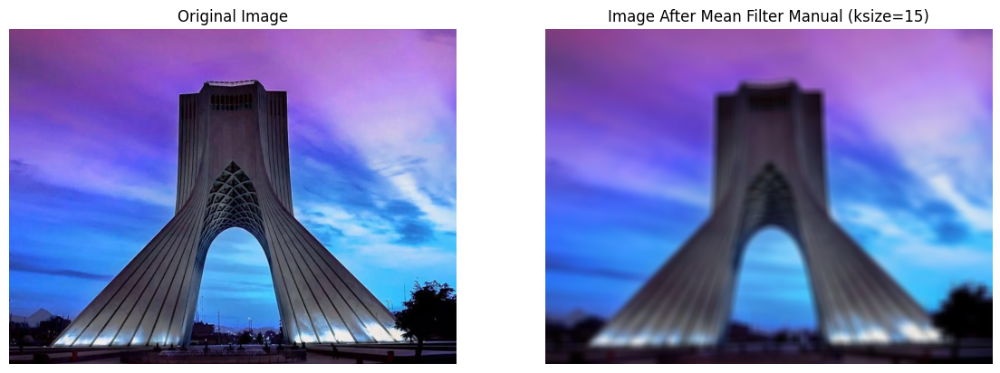

In [ ]:
img_mean_filter_manual = mean_filter(img, 15)

plt.figure(figsize=(14,8))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img_mean_filter_manual)
plt.title("Image After Mean Filter Manual (ksize=15)")
plt.axis("off")
plt.show()

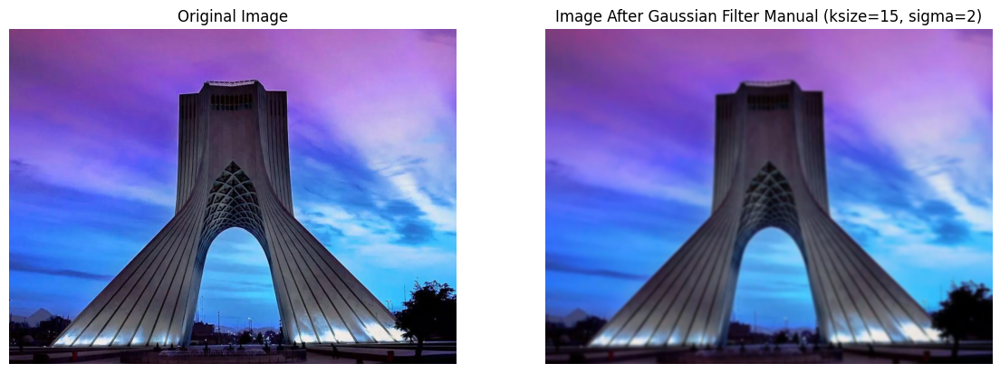

In [ ]:
img_gaussian_filter_manual = gaussian_filter(img, 15, 2)

plt.figure(figsize=(14,8))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img_gaussian_filter_manual)
plt.title("Image After Gaussian Filter Manual (ksize=15, sigma=2)")
plt.axis("off")
plt.show()

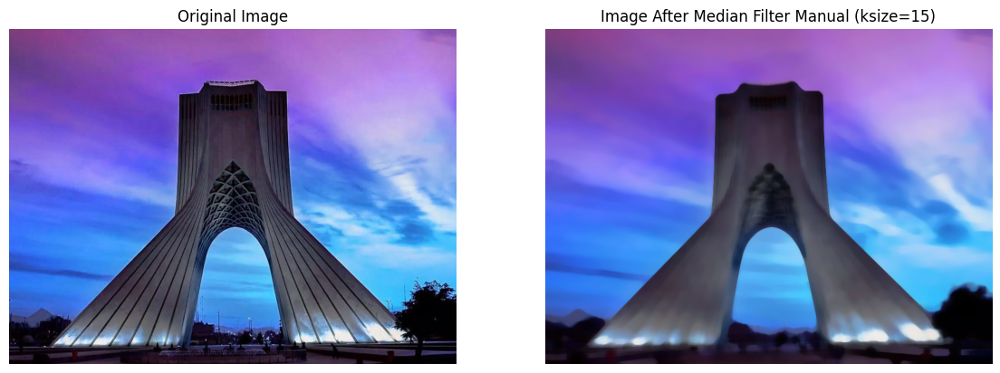

In [ ]:
img_median_filter_manual = median_filter(img, 15)

plt.figure(figsize=(14,8))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img_median_filter_manual)
plt.title("Image After Median Filter Manual (ksize=15)")
plt.axis("off")
plt.show()

### 5. Applying the best filter on the previous salt and pepper noised image.

Among the three filters — Mean, Gaussian, and Median — the ***Median Filter*** is generally the best choice for noise removal, especially when the noise type is Salt and Pepper (impulse noise).

Sorting these filters based on their usage for noise removal:

1. ***Median Filter***: Most effective for noise removal. It replaces each pixel with the median value of its neighborhood instead of the mean. Because of this, it ignores extreme outliers (very dark or very bright pixels) that represent noise. Also, salt and pepper noise consists of a few pixels that are either 0 (black) or 255 (white). The median operation sorts the neighborhood values and picks the middle one, effectively rejecting those extreme spikes. It preserves edges much better than averaging filters because it doesn’t blur across intensity jumps.

2. ***Gaussian Filter***: Best for Gaussian noise. If the image is corrupted by Gaussian (additive) noise, the Gaussian filter performs better. Its weights follow the Gaussian curve, giving more importance to the central pixels and less to distant ones, resulting in smooth denoising with less edge distortion than a simple mean filter.

3. ***Mean Filter***: Simple but weak. It is the most basic filter which smooths the image by averaging all pixels in the neighborhood. While it reduces random noise slightly, it also blurs edges and reduces image details, since every pixel, including noise, affects the average.

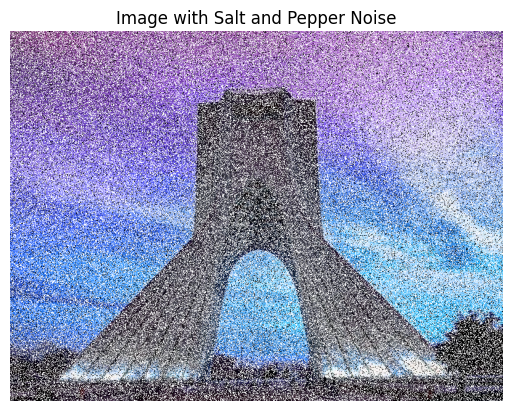

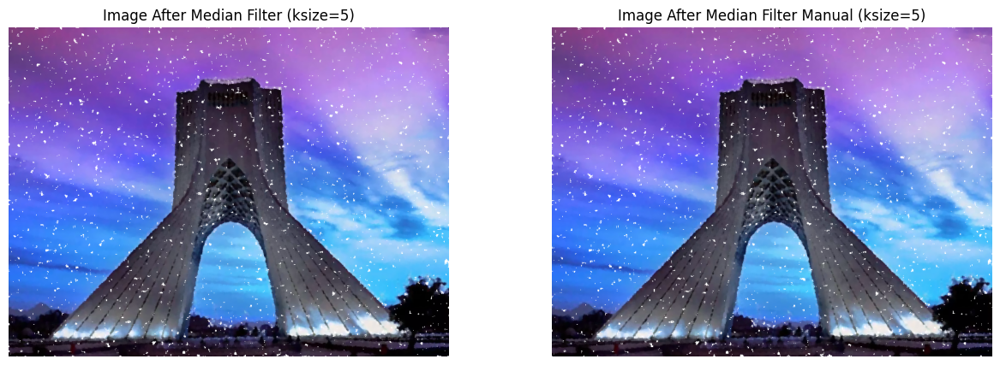

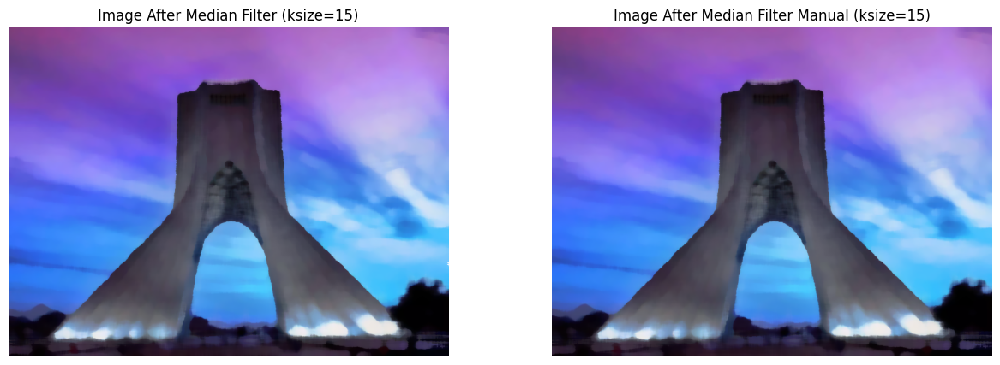

In [ ]:
img_noised_median_filter5 = cv2.medianBlur(img_salt_pepper_noise, 5)
img_noised_median_filter5_manual = median_filter(img_salt_pepper_noise, 5)

img_noised_median_filter15 = cv2.medianBlur(img_salt_pepper_noise, 15)
img_noised_median_filter15_manual = median_filter(img_salt_pepper_noise, 15)

plt.imshow(img_salt_pepper_noise)
plt.title("Image with Salt and Pepper Noise")
plt.axis("off")
plt.show()

plt.figure(figsize=(15,5))

plt.subplot(1, 2, 1)
plt.imshow(img_noised_median_filter5)
plt.title("Image After Median Filter (ksize=5)")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img_noised_median_filter5_manual)
plt.title("Image After Median Filter Manual (ksize=5)")
plt.axis("off")
plt.show()

plt.figure(figsize=(15,5))

plt.subplot(1, 2, 1)
plt.imshow(img_noised_median_filter15)
plt.title("Image After Median Filter (ksize=15)")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img_noised_median_filter15_manual)
plt.title("Image After Median Filter Manual (ksize=15)")
plt.axis("off")
plt.show()

The first image shows heavy salt and pepper noise, many random black (0) and white (255) pixels scattered across the whole picture. The two other images, after applying the Median filter, shows that most of the random black and white dots have been removed and the main structure (the Azadi Tower) and sky colors are restored clearly. Also some small bright or dark specks remain, which means the noise wasn’t completely removed (depends on kernel size).

This confirms that the Median filter effectively removes impulse noise because it replaces each pixel with the median of its local neighborhood; the middle value, not the mean. That makes it resistant to outliers (extremely high or low pixel values).

Also with increasing $ksize$, more noise will be removed because each median is computed over a larger neighborhood, so outliers are less likely to survive. But the image becomes smoother and blurrier; fine details and small edges start to disappear. With decreasing $ksize$, edges will be kept sharper and details will be clearer. However, some noise pixels may remain because the median is computed over a smaller neighborhood.

###  6. Applying *Sobel Filter*, *laplacian Filter*, and *Canny Filter* (edge detectors) on the original image.

- ***Sobel Filter:*** It measures how intensity changes in the $x$ and $y$ directions. The edge magnitude is computed as $G = \sqrt{{G_x}^2 + {G_y}^2}$ and the direction as $\theta = \tan^{-1}\left(\frac{G_y}{G_x}\right)$. Its type is Gradient-based (first-order derivative). For its kernel type, it uses two $3 \times 3$ convolution masks; $G_x$ detects horizontal edges, and $G_y$ detects vertical edges. For example:
	​


    - Horizontal $G_x$:
    $$
    \begin{bmatrix}
    -1 & 0 & -1 \\
    -2 & 0 & -2 \\
    -1 & 0 & -1
    \end{bmatrix}
    $$

    - Vertical $G_y$:
    $$
    \begin{bmatrix}
    -1 & -2 & -1 \\
    0 & 0 & 0 \\
    -1 & -2 & -1
    \end{bmatrix}
    $$

    Also its is fast, simple detection of strong edges and their orientation. Often used as a preprocessing step before higher-level edge analysis.

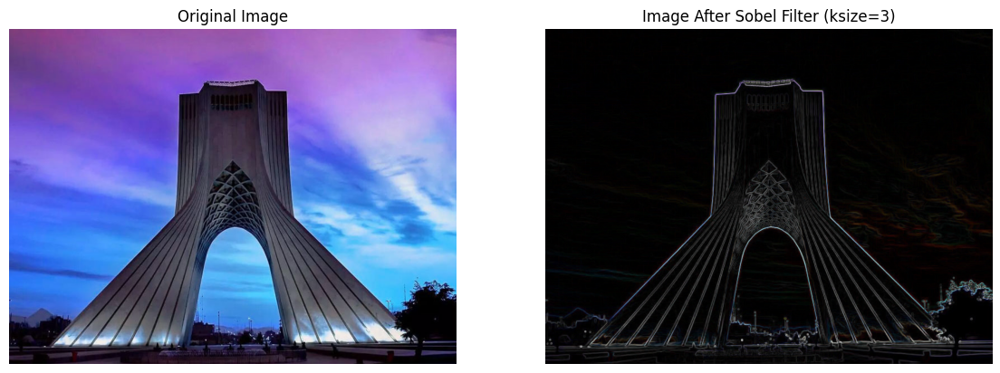

In [ ]:
Gx = cv2.Sobel(img, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=3)
Gy = cv2.Sobel(img, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=3)

G = np.hypot(Gx, Gy)
img_sobel_filter = (G / G.max() * 255).astype(np.uint8)

plt.figure(figsize=(14,8))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img_sobel_filter)
plt.title("Image After Sobel Filter (ksize=3)")
plt.axis("off")
plt.show()

- ***Laplacian Filter:*** It detects edges by finding zero-crossings of the second derivative; points where the intensity curve switches from increasing to decreasing. Since it reacts strongly to noise, it’s often applied after a Gaussian blur (Laplacian of Gaussian, LoG). Its type is Second-order derivative (measures rate of change of the gradient). For its kernel type, it uses a single symmetric kernel emphasizing areas where intensity changes sharply in all directions. For example:

    - $3 \times 3$ kernel:
    $$
    \begin{bmatrix} 
    0 & -1 & 0\\ 
    -1 & 4 & -1\\ 
    0 & -1 & 0 
    \end{bmatrix}
    $$

    - Another $3 \times 3$ kernel:
    $$
    \begin{bmatrix} 
    -1 & -1 & -1\\ 
    -1 & 8 & -1\\ 
    -1 & -1 & -1 
    \end{bmatrix}
    $$

    Also it highlights fine details and edges in all directions, useful for outline detection.

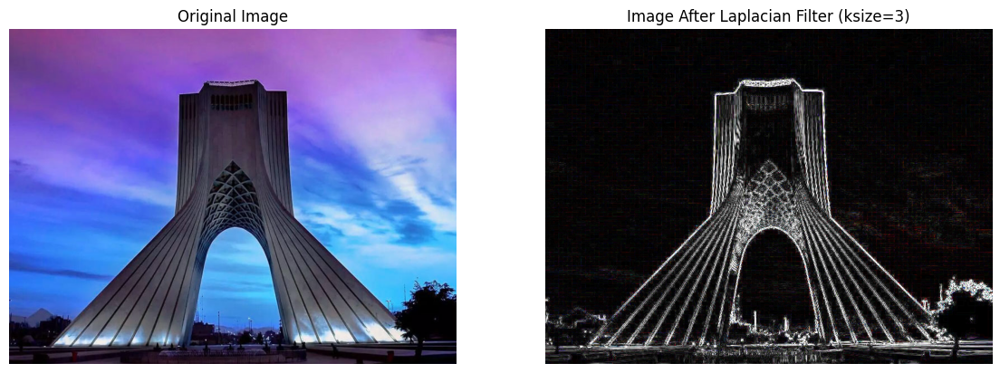

In [114]:
lap = cv2.Laplacian(img, ddepth=cv2.CV_64F, ksize=3)
img_laplacian_filter = cv2.convertScaleAbs(lap)

plt.figure(figsize=(14,8))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img_laplacian_filter)
plt.title("Image After Laplacian Filter (ksize=3)")
plt.axis("off")
plt.show()

- ***Canny Filter:*** It is not just a convolution; it is a full edge detection pipeline. It produces thin, clean, and continuous edges, making it one of the most robust and widely used methods. Its type is multi-stage algorithm combining Gaussian smoothing, gradient detection, and hysteresis thresholding. For its kernel type, it uses Sobel-like gradient kernels internally to compute edges, but the process includes several steps:

1. Gaussian blur: Smooth the image to reduce noise.

2. Gradient calculation: Apply Sobel filters to get magnitude and direction.

3. Non-maximum suppression: Thin out edges to 1-pixel width.

4. Double threshold + hysteresis: Keep only strong edges, and connect weak ones if they’re linked to strong edges. Pixels whose gradient magnitude is greater than *Threshold2 (High)* value are considered strong edges and are definitely kept. Pixels whose gradient magnitude lies between the *Threshold1 (Low)* and *Threshold2 (High)* are kept only if they are connected to a strong edge (hysteresis). All others are discarded. 

Also it is typically using in precision edge maps in object recognition, shape detection, and computer vision preprocessing.

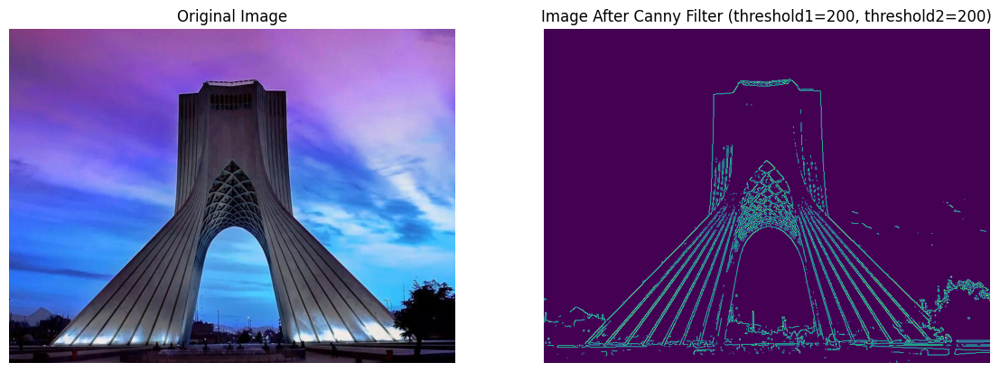

In [129]:
img_canny_filter = cv2.Canny(img, threshold1=200, threshold2=200)

plt.figure(figsize=(14,8))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img_canny_filter)
plt.title("Image After Canny Filter (threshold1=200, threshold2=200)")
plt.axis("off")
plt.show()

Also, we implement each filter without any built-in function.

In [164]:
def sobel_filter(img, Gx_kernel=None, Gy_kernel=None, ksize=3):
    if (img.ndim == 3):
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        gray = img
        
    gray = gray.astype(np.float32)

    if (Gx_kernel == None):
        Gx_kernel = np.array([[-1, 0, 1],
                              [-2, 0, 2],
                              [-1, 0, 1]], dtype=np.float32)

    if (Gy_kernel == None):
        Gy_kernel = np.array([[-1, -2, -1],
                              [ 0,  0,  0],
                              [ 1,  2,  1]], dtype=np.float32)

    Gx = conv2d(gray, Gx_kernel)
    Gy = conv2d(gray, Gy_kernel)

    G = np.sqrt(Gx**2 + Gy**2)
    
    out = (G / G.max() * 255).astype(np.uint8)

    return out

In [158]:
def laplacian_filter(img, kernel=None, ksize=3):
    if (img.ndim == 3):
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        gray = img
        
    gray = gray.astype(np.float32)

    if (kernel == None):
        kernel = np.array([[0, -1, 0],
                           [-1, 4, -1],
                           [0, -1, 0]], dtype=np.float32)

    lap = conv2d(gray, kernel)

    out = np.clip(np.abs(lap), 0, 255).astype(np.uint8)

    return out

In [153]:
def non_max_suppression(mag, angle_deg):
    h, w = mag.shape
    out = np.zeros((h, w), dtype=np.float32)

    ang = angle_deg.copy()
    ang[ang < 0] += 180  # map angles to [0, 180]

    for i in range(1, h - 1):
        for j in range(1, w - 1):
            q = r = 0.0
            deg = ang[i, j]

            # Pick neighbors aligned with the gradient direction
            if (0 <= deg < 22.5) or (157.5 <= deg <= 180):
                q, r = mag[i, j + 1], mag[i, j - 1]
            elif (22.5 <= deg < 67.5):
                q, r = mag[i + 1, j - 1], mag[i - 1, j + 1]
            elif (67.5 <= deg < 112.5):
                q, r = mag[i + 1, j], mag[i - 1, j]
            else:
                q, r = mag[i - 1, j - 1], mag[i + 1, j + 1]

            # Keep only if current pixel is a local maximum
            if (mag[i, j] >= q) and (mag[i, j] >= r):
                out[i, j] = mag[i, j]
    return out

def canny_filter(img, threshold1, threshold2, Gx_kernel=None, Gy_kernel=None):
    # Convert to grayscale and float32
    if img.ndim == 3:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        gray = img
    gray = gray.astype(np.float32)

    # Gaussian smoothing (σ ≈ 1.4) to reduce noise before gradients
    blur = gaussian_filter(gray, sigma=1.4)

    # Default Sobel 3x3 kernels if none provided
    if Gx_kernel is None:
        Gx_kernel = np.array([[-1, 0, 1],
                              [-2, 0, 2],
                              [-1, 0, 1]], dtype=np.float32)
    if Gy_kernel is None:
        Gy_kernel = np.array([[-1, -2, -1],
                              [ 0,  0,  0],
                              [ 1,  2,  1]], dtype=np.float32)

    # Gradient magnitude and angle
    gx = conv2d(blur, Gx_kernel)
    gy = conv2d(blur, Gy_kernel)
    mag = np.hypot(gx, gy)                 # sqrt(gx^2 + gy^2)
    angle = np.degrees(np.arctan2(gy, gx)) # gradient direction in degrees

    # Non-Maximum Suppression to thin edges
    thin = non_max_suppression(mag, angle)

    # Normalize to 0..255 so thresholds are meaningful like OpenCV's Canny
    tmax = thin.max() if thin.max() > 0 else 1.0
    thin_norm = (thin / tmax) * 255.0
    thin_norm = np.clip(thin_norm, 0, 255).astype(np.uint8)

    # Double thresholding (hysteresis seeds)
    low  = int(min(threshold1/10, threshold2/10))
    high = int(max(threshold1/10, threshold2/10))

    strong, weak = 255, 75
    out = np.zeros_like(thin_norm, dtype=np.uint8)

    si, sj = np.where(thin_norm >= high)
    wi, wj = np.where((thin_norm >= low) & (thin_norm < high))

    out[si, sj] = strong
    out[wi, wj] = weak

    # Hysteresis: keep weak pixels only if connected to a strong edge
    h, w = out.shape
    for i in range(1, h - 1):
        for j in range(1, w - 1):
            if out[i, j] == weak:
                if np.any(out[i - 1 : i + 2, j - 1 : j + 2] == strong):
                    out[i, j] = strong
                else:
                    out[i, j] = 0

    # Suppress everything that's not a final strong edge
    out[out != strong] = 0

    return out

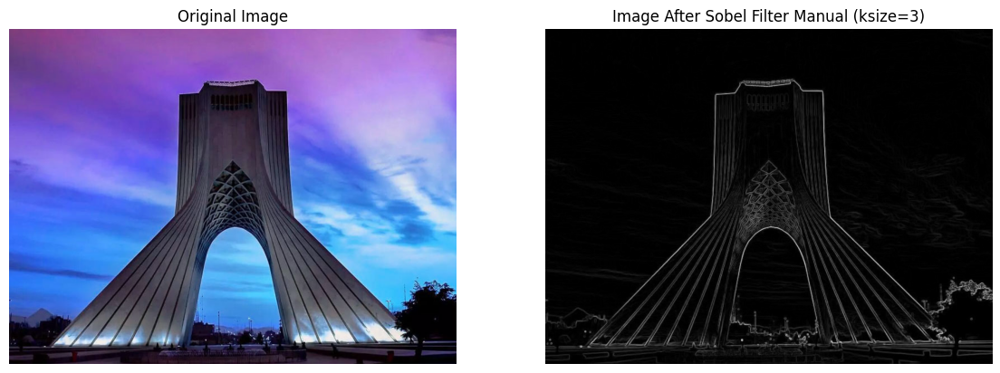

In [165]:
img_sobel_filter_manual = sobel_filter(img)

plt.figure(figsize=(14,8))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img_sobel_filter_manual, cmap="gray", vmin=0, vmax=255)
plt.title("Image After Sobel Filter Manual (ksize=3)")
plt.axis("off")
plt.show()

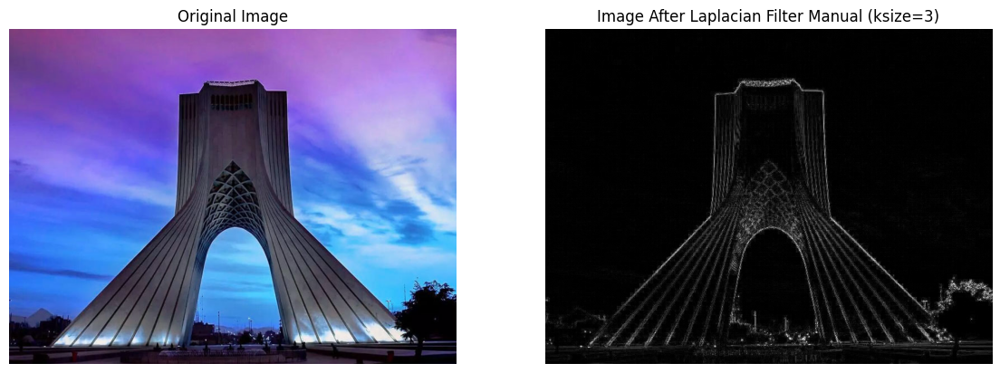

In [167]:
img_laplacian_filter_manual = laplacian_filter(img)

plt.figure(figsize=(14,8))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img_laplacian_filter_manual, cmap="gray", vmin=0, vmax=255)
plt.title("Image After Laplacian Filter Manual (ksize=3)")
plt.axis("off")
plt.show()

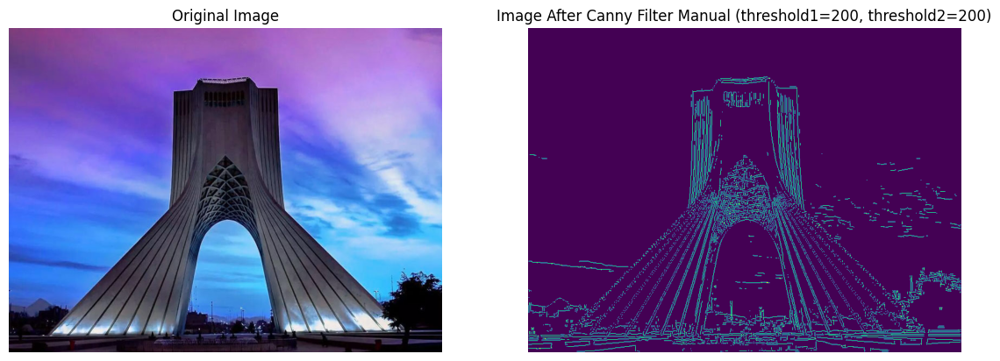

In [154]:
img_canny_filter_manual = canny_filter(img, threshold1=200, threshold2=200)

plt.figure(figsize=(14,8))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img_canny_filter_manual)
plt.title("Image After Canny Filter Manual (threshold1=200, threshold2=200)")
plt.axis("off")
plt.show()

## 📍 Section 3

In [139]:
# Load the video
filename = "Original_Vid.mp4"
cap = cv2.VideoCapture(filename)

if not cap.isOpened():
    raise ValueError("Could not open the video file.")

# Get number of frames and FPS
frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
fps = cap.get(cv2.CAP_PROP_FPS)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

print(f"Number of frames: {frame_count}")
print(f"FPS: {fps}")
print(f"Frame size: {width}x{height}")

# Release the video capture
cap.release()

Number of frames: 545
FPS: 30.0
Frame size: 640x360


<p dir='rtl' style='background:#fffbe6; font-family: Vazir; border:1px dashed #f0ad4e; padding:12px; border-radius:8px; color:#111'> 
Number of frames: 545<br>
تعداد کل فریم‌های ویدیو ۵۴۵ است. این عدد نشان می‌دهد که ویدیو از ۵۴۵ تصویر پشت سر هم تشکیل شده است که در زمان پخش به ترتیب نمایش داده می‌شوند.<br> <br>
FPS: 30.0<br>
FPS یا Frames Per Second تعداد فریم‌هایی است که در هر ثانیه نمایش داده می‌شوند. در این ویدیو، نرخ ۳۰ فریم در ثانیه است که پخش روان و یکنواخت را تضمین می‌کند.<br> <br>
Frame size: 640x360<br>
ابعاد فریم‌ها ۶۴۰ در ۳۶۰ پیکسل است. این اندازه مشخص می‌کند که هر فریم چه عرض و ارتفاعی دارد و کیفیت و وضوح تصویر را تعیین می‌کند.<br> <br>
با داشتن این اطلاعات می‌توان ویدیو را برای پردازش‌های بعدی مانند اعمال فیلتر، افزودن نویز یا تغییر ابعاد آماده کرد.<br>
</p>

In [2]:
# Load the original video
filename = "Original_Vid.mp4"
cap = cv2.VideoCapture(filename)

if not cap.isOpened():
    raise ValueError("Could not open the video file.")

# Get video properties
frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
fps = cap.get(cv2.CAP_PROP_FPS)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Prepare output video writer
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter("Noise_Vid.mp4", fourcc, fps, (width, height))

def add_salt_pepper_noise(frame, salt_prob=0.01, pepper_prob=0.01):
    noisy = frame.copy()
    h, w, c = frame.shape
    # Salt noise
    num_salt = np.ceil(salt_prob * h * w)
    coords = [np.random.randint(0, i, int(num_salt)) for i in (h, w)]
    noisy[coords[0], coords[1], :] = 255

    # Pepper noise
    num_pepper = np.ceil(pepper_prob * h * w)
    coords = [np.random.randint(0, i, int(num_pepper)) for i in (h, w)]
    noisy[coords[0], coords[1], :] = 0

    return noisy

# Process each frame
while True:
    ret, frame = cap.read()
    if not ret:
        break

    # Add salt-and-pepper noise
    noisy_frame = add_salt_pepper_noise(frame, salt_prob=0.01, pepper_prob=0.01)

    # Write the noisy frame to output video
    out.write(noisy_frame)

# Release resources
cap.release()
out.release()
print("Video with salt-and-pepper noise saved as 'Noise_Vid.mp4'.")


Video with salt-and-pepper noise saved as 'Noise_Vid.mp4'.
